### Part 1:

In [1]:
# Import packages you need
from sklearn import tree, svm, metrics
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import graphviz
from ydata_profiling import ProfileReport   

#from IPython.core.display import HTML

# Set default plotting method
%matplotlib inline 


C:\Users\ricdr\AppData\Local\Temp\ipykernel_20900\1412147423.py:10: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport


### Step 1: Data pre-processing
Import the data and preprocess the feature set for classification.

In [24]:
##Read from file

path = "here your path"

MF_US_v1_clean = pd.read_excel(path + "MF_US_v1.xlsx",sheet_name ="1")
MF_US_v1_clean.head()


,Ticker,Fund_Comp_Name,PM_Yrs,3yr_TR_Ann,5yr_TR_Ann,AUM USDmm,N_Holdings,Fund_P/E,Fund_P/B,Fund_P/S,Informatio_R,Sortino_R,Sharpe_R,Tracking_Error,Max_Drawdown_Pct,Expense_Ratio
0,SPUSX US Equity,Symmetry Panoramic Trust,8.0,20.03277,11.866170,450.364930,555,26.54285,2.953631,2.022929,0.000000,1.963100,1.887736,0.000000,-8.141703,0.65
1,NDARX US Equity,American Funds Retirement Inco,8.0,15.37032,8.289287,2376.376646,12,22.27807,3.455544,2.327098,-0.886353,1.542032,1.575164,6.729614,-6.342767,0.61
2,NAVFX US Equity,Starboard Investment Trust,8.0,18.55442,9.967515,44.782604,13,36.63818,4.711519,2.584692,-1.339706,1.125482,1.070641,3.787796,-10.140237,2.04
3,QTSSX US Equity,Advisors Preferred Trust/Advis,8.0,14.73446,0.263503,133.079406,16,27.77999,5.170212,3.471829,0.343004,1.241805,1.349851,10.767460,-11.524516,1.72
4,HMSIX US Equity,Hennessy Funds Trust,8.0,20.22276,23.473400,79.430049,17,18.48419,3.298593,1.352942,-1.424799,1.170787,1.310094,5.571826,-6.929348,1.53


In [25]:
# Label data based on over/under performance


MF_US_v1_clean["label"]=0
MF_US_v1_clean.loc[MF_US_v1_clean["5yr_TR_Ann"] > MF_US_v1_clean["5yr_TR_Ann"].iloc[-1], "label"] = 1
MF_US_v1_clean.loc[MF_US_v1_clean["5yr_TR_Ann"] <= MF_US_v1_clean["5yr_TR_Ann"].iloc[-1], "label"] = -1
MF_US_v1_clean.sample(10)


,Ticker,Fund_Comp_Name,PM_Yrs,3yr_TR_Ann,5yr_TR_Ann,AUM USDmm,N_Holdings,Fund_P/E,Fund_P/B,Fund_P/S,Informatio_R,Sortino_R,Sharpe_R,Tracking_Error,Max_Drawdown_Pct,Expense_Ratio,label
505,MNNAX US Equity,Victory Portfolios,27.652055,24.63723,15.504240,587.076753,141,21.25286,5.196061,1.983991,1.476269,2.120824,2.094849,3.369296,-9.715872,1.24,1
204,WMKGX US Equity,Wesmark Funds,2.630137,21.80256,11.303360,374.505451,66,28.16137,5.677941,4.928596,1.247103,1.891729,1.750723,3.557547,-11.061750,1.14,-1
367,MLMAX US Equity,Morgan Stanley Institutional F,10.630137,19.40000,9.679347,67.062176,46,23.10371,5.773982,3.420507,-1.060088,0.800854,0.856323,5.259967,-13.389968,1.35,-1
239,FKICX US Equity,Fidelity Concord Street Trust,4.632877,20.06883,9.228476,20.791005,153,49.82951,3.419376,1.870243,-0.304262,1.846950,1.861446,6.384612,-12.419354,0.60,-1
415,EGLAX US Equity,Northern Lights Fund Trust/Pri,14.621918,27.07689,28.147450,276.389176,24,33.47180,3.834464,1.141616,0.464290,1.574783,1.830792,25.039492,-7.272587,1.65,1
389,SCRYX US Equity,Sanford C Bernstein Fund Inc,11.641096,16.75516,9.140381,868.940535,288,0.00000,2.589419,1.596259,-0.398376,2.240549,2.059453,4.054607,-9.436954,0.89,-1
251,FSOPX US Equity,Fidelity Securities Fund,5.608219,22.43108,13.087730,4733.994719,236,70.20168,2.931035,1.696489,0.444563,2.682209,2.470007,6.791811,-9.988962,0.00,-1
38,INPIX US Equity,ProFunds,8.000000,26.76249,-0.175712,82.187374,53,36.27038,8.126826,5.477316,-0.410656,0.219603,0.222606,23.994946,-32.040966,1.48,-1
511,VGSIX US Equity,Vanguard Specialized Funds,30.654795,11.19226,2.270876,33845.619135,157,40.52782,2.818058,5.020083,-2.772112,0.780493,0.802841,0.097044,-8.312122,0.27,-1
117,GCEQX US Equity,Green Century Funds,8.000000,20.77751,11.363980,825.882806,343,29.76018,6.704699,3.857935,-0.065599,1.340506,1.312651,4.459883,-12.268229,1.20,-1


In [26]:
# Define columns
MF_US_v1_training_features = ["PM_Yrs", "AUM USDmm", "N_Holdings", "Fund_P/E", "Fund_P/B", "Fund_P/S", "Informatio_R", "Sortino_R", "Sharpe_R", "Tracking_Error", "Max_Drawdown_Pct", "Expense_Ratio"]
MF_US_v1_training_features_w_label = MF_US_v1_training_features  + ["label"]
MF_US_v1_clean

,Ticker,Fund_Comp_Name,PM_Yrs,3yr_TR_Ann,5yr_TR_Ann,AUM USDmm,N_Holdings,Fund_P/E,Fund_P/B,Fund_P/S,Informatio_R,Sortino_R,Sharpe_R,Tracking_Error,Max_Drawdown_Pct,Expense_Ratio,label
0,SPUSX US Equity,Symmetry Panoramic Trust,8.000000,20.03277,11.866170,450.364930,555,26.54285,2.953631,2.022929,0.000000,1.963100,1.887736,0.000000,-8.141703,0.65,-1
1,NDARX US Equity,American Funds Retirement Inco,8.000000,15.37032,8.289287,2376.376646,12,22.27807,3.455544,2.327098,-0.886353,1.542032,1.575164,6.729614,-6.342767,0.61,-1
2,NAVFX US Equity,Starboard Investment Trust,8.000000,18.55442,9.967515,44.782604,13,36.63818,4.711519,2.584692,-1.339706,1.125482,1.070641,3.787796,-10.140237,2.04,-1
3,QTSSX US Equity,Advisors Preferred Trust/Advis,8.000000,14.73446,0.263503,133.079406,16,27.77999,5.170212,3.471829,0.343004,1.241805,1.349851,10.767460,-11.524516,1.72,-1
4,HMSIX US Equity,Hennessy Funds Trust,8.000000,20.22276,23.473400,79.430049,17,18.48419,3.298593,1.352942,-1.424799,1.170787,1.310094,5.571826,-6.929348,1.53,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517,RYHIX US Equity,Rydex Series Funds,33.654795,12.19346,5.095322,21.435290,141,51.35907,3.760743,1.315235,0.170421,1.602450,1.448483,15.440659,-11.305866,1.38,-1
518,RYFIX US Equity,Rydex Series Funds,33.654795,18.58464,8.073123,21.630673,162,16.94507,2.188025,2.151664,-0.905480,0.598708,0.603081,10.245113,-13.515496,1.45,-1
519,RYSOX US Equity,Rydex Series Funds,33.654795,20.37390,11.569470,168.002543,519,26.19050,5.136475,3.088420,-9.836499,1.529396,1.432333,0.163551,-9.064327,1.61,-1
520,GVEQX US Equity,Williamsburg Investment Trust,35.657534,23.47974,13.814120,113.666968,86,26.93732,5.628979,3.362764,-0.160779,1.442402,1.430793,3.979304,-10.238730,0.88,1


In [27]:
# Remove records with empty value
MF_US_v1_clean_ = MF_US_v1_clean[MF_US_v1_training_features_w_label].dropna()

# Snapshot the cleaned data
MF_US_v1_clean_[MF_US_v1_training_features_w_label].to_excel(path + "MF_US_v1_clean.xlsx")

# Display cleaned data 
MF_US_v1_clean_.head()

,PM_Yrs,AUM USDmm,N_Holdings,Fund_P/E,Fund_P/B,Fund_P/S,Informatio_R,Sortino_R,Sharpe_R,Tracking_Error,Max_Drawdown_Pct,Expense_Ratio,label
0,8.0,450.364930,555,26.54285,2.953631,2.022929,0.000000,1.963100,1.887736,0.000000,-8.141703,0.65,-1
1,8.0,2376.376646,12,22.27807,3.455544,2.327098,-0.886353,1.542032,1.575164,6.729614,-6.342767,0.61,-1
2,8.0,44.782604,13,36.63818,4.711519,2.584692,-1.339706,1.125482,1.070641,3.787796,-10.140237,2.04,-1
3,8.0,133.079406,16,27.77999,5.170212,3.471829,0.343004,1.241805,1.349851,10.767460,-11.524516,1.72,-1
4,8.0,79.430049,17,18.48419,3.298593,1.352942,-1.424799,1.170787,1.310094,5.571826,-6.929348,1.53,1


### **Step 2: Explore the clean dataset**

In [28]:
MF_US_v1_clean_.describe()

,PM_Yrs,AUM USDmm,N_Holdings,Fund_P/E,Fund_P/B,Fund_P/S,Informatio_R,Sortino_R,Sharpe_R,Tracking_Error,Max_Drawdown_Pct,Expense_Ratio,label
count,522.000000,5.220000e+02,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000
mean,10.095835,1.565183e+04,319.662835,30.304697,4.602294,3.103108,-0.573747,1.491545,1.459536,5.958214,-10.254877,0.836351,-0.570881
std,6.735558,9.733770e+04,569.282952,23.879549,2.060483,1.767479,2.233329,0.657359,0.651297,5.768588,3.535549,0.765723,0.821820
min,0.136986,2.079101e+01,12.000000,0.000000,0.000000,0.727530,-31.621075,-0.505891,-0.478753,0.000000,-32.040966,0.000000,-1.000000
25%,6.638356,2.517174e+02,55.000000,23.654318,3.031854,1.921968,-1.157700,1.126619,1.083453,1.738087,-10.997019,0.482500,-1.000000
50%,8.000000,1.002558e+03,108.000000,26.791815,4.792685,2.887891,-0.314406,1.581775,1.539640,4.231305,-9.113033,0.850000,-1.000000
75%,11.641096,4.227030e+03,375.250000,30.273985,5.677765,3.530006,0.379420,1.825036,1.810870,8.507750,-8.359961,1.090000,-1.000000
max,35.657534,1.624702e+06,3892.000000,406.815200,16.138190,15.804190,7.523003,3.815752,4.169282,31.137520,-3.415409,10.290000,1.000000


In [29]:
# Display Pandas Profiling Report
# Please note that loading may take 1-2 minutes.

profile = ProfileReport(MF_US_v1_clean_, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 99138.09it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **Step 3: Split data to training and testing datasets**

In [30]:
# Split into random train and test subsets

X = MF_US_v1_clean_[MF_US_v1_training_features]
y = MF_US_v1_clean_["label"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

### **Step 4: Try out machine learning models**
#### We will try 4 machine learning models:

*   CART
*   SVM
*   KNN
*   Random Forest

### Model 1: CART

In [97]:
# Train the decision tree
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X_train, y_train)

In [98]:
# Visualize the tree
dot_data = tree.export_graphviz(clf, out_file=None,  
                filled=True, rounded=True,
                special_characters=True, feature_names=MF_US_v1_training_features)
graph = graphviz.Source(dot_data)
from IPython.display import Image 
Image(graph.pipe(format="png"))




'arbol_cart.png'

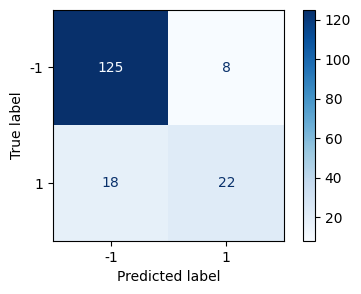

In [96]:
# Evaluate by Confusion matrix
fig, ax = plt.subplots(figsize=(5, 3))
metrics.ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, values_format='d', cmap='Blues',ax=ax)
plt.show()

In [82]:
# Evaluate by scores

y_pred_CART=clf.predict(X_test)
accuracy_CART = metrics.accuracy_score(y_test, y_pred_CART)
f1_CART = metrics.f1_score(y_test, y_pred_CART, average='weighted')
df_compare_MF_US_v1 = pd.DataFrame(columns=['Accuracy','F1'])
df_compare_MF_US_v1.loc['CART']={'Accuracy':accuracy_CART,'F1':f1_CART}
df_compare_MF_US_v1

,Accuracy,F1
CART,0.843931,0.834589


### Model 2: SVM on MF Data

In [57]:
# Train the SVC
#clf = svm.SVC(gamma='scale')
#clf.fit(X_train, y_train) 


In [83]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn import svm

clf = make_pipeline(
    StandardScaler(),
    svm.SVC(gamma='scale', class_weight='balanced')
)
clf.fit(X_train, y_train)

,steps,"[('standardscaler', ...), ('svc', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,C,1.0
,kernel,'rbf'
,degree,3
,gamma,'scale'


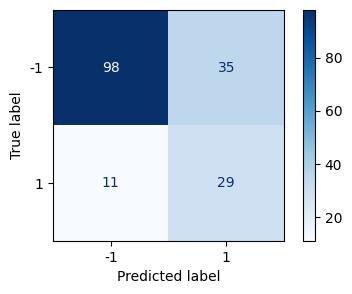

In [84]:
# Evaluate the confusion matrix
fig, ax = plt.subplots(figsize=(5, 3))
metrics.ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, values_format='d', cmap='Blues', ax=ax)
plt.show()

In [85]:
# Evaluate by scores
y_pred_svm=clf.predict(X_test)
accuracy_svm = metrics.accuracy_score(y_test, y_pred_svm)
f1_svm = metrics.f1_score(y_test, y_pred_svm, average='weighted')
df_compare_MF_US_v1.loc['SVM']={'Accuracy':accuracy_svm,'F1':f1_svm}
df_compare_MF_US_v1

,Accuracy,F1
CART,0.843931,0.834589
SVM,0.734104,0.751599


### Model 3: KNN on MF data

In [61]:
# Train the KNN
#neigh = KNeighborsClassifier(n_neighbors=3)
#neigh.fit(X_train, y_train) 

,n_neighbors,3
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [86]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier

neigh = make_pipeline(
    StandardScaler(),
    KNeighborsClassifier(n_neighbors=5, weights='distance')
)
neigh.fit(X_train, y_train)

,steps,"[('standardscaler', ...), ('kneighborsclassifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,n_neighbors,5
,weights,'distance'
,algorithm,'auto'
,leaf_size,30


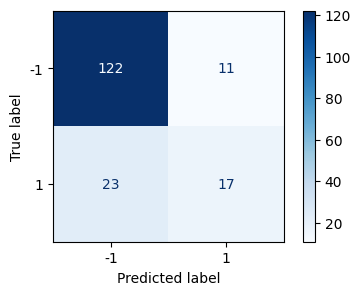

In [87]:
# Evaluate by confusion matrix
fig, ax = plt.subplots(figsize=(5, 3))
metrics.ConfusionMatrixDisplay.from_estimator(neigh, X_test, y_test, values_format='d', cmap='Blues', ax=ax)
plt.show()

In [88]:
# Evaluate by scores

y_pred_knn = neigh.predict(X_test)
accuracy_knn = metrics.accuracy_score(y_test, y_pred_knn)
f1_knn = metrics.f1_score(y_test, y_pred_knn, average='weighted')
df_compare_MF_US_v1.loc['KNN'] = {'Accuracy': accuracy_knn, 'F1': f1_knn}
df_compare_MF_US_v1

,Accuracy,F1
CART,0.843931,0.834589
SVM,0.734104,0.751599
KNN,0.803468,0.790369


### Model 4: RandomForest on MF Data

In [90]:
# Train the RandomForest model
clf = RandomForestClassifier(n_estimators=100, max_depth=20, random_state=0)
clf.fit(X_train, y_train) 

,n_estimators,100
,criterion,'gini'
,max_depth,20
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


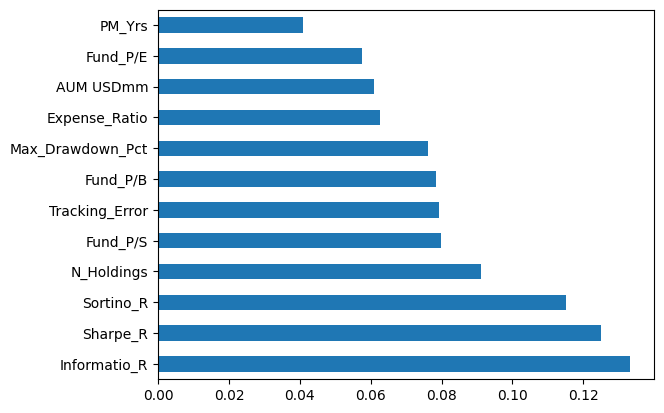

In [91]:
# Explore feature importances
bar_data = pd.Series(clf.feature_importances_, index=X_train.columns)
bar_data.nlargest(20).plot(kind='barh')
plt.show()

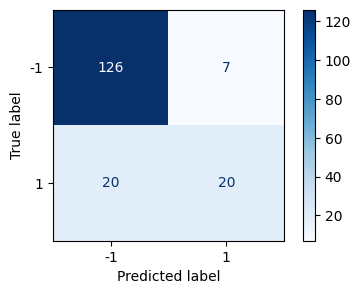

In [92]:
# Evaluate by confusion matrix
fig, ax = plt.subplots(figsize=(5, 3))
metrics.ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, values_format='d', cmap='Blues', ax=ax)
plt.show()

In [93]:
# Evaluate by scores
y_pred_rf=clf.predict(X_test)
accuracy_rf = metrics.accuracy_score(y_test, y_pred_rf)
f1_rf = metrics.f1_score(y_test, y_pred_rf, average='weighted')
df_compare_MF_US_v1.loc['RandomForest'] = {'Accuracy':accuracy_rf,'F1':f1_rf}
df_compare_MF_US_v1

,Accuracy,F1
CART,0.843931,0.834589
SVM,0.734104,0.751599
KNN,0.803468,0.790369
RandomForest,0.843931,0.832426
